In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
main_dir = '/content/gdrive/My Drive/krushimitra_be/merged1.csv'

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
data = pd.read_csv(main_dir, parse_dates=['datetime_utc'],index_col='datetime_utc')

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import itertools

from fbprophet import Prophet  # for forecasting
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.diagnostics import cross_validation, performance_metrics

In [ ]:
data['date'] = data.index

In [ ]:
train_df = data['1996':'2017']

test_df = data['2018':]

In [ ]:
test_df.describe()

,humidity,temprature
count,731.000000,731.000000
mean,36.935819,29.095873
std,16.097355,7.876799
min,4.708333,11.875000
25%,25.895833,22.687500
50%,34.916667,30.541667
75%,49.145833,35.104167
max,84.250000,46.750000


In [ ]:
train_df.head()

,humidity,temprature,date
datetime_utc,,,
1996-11-01,52.916667,22.333333,1996-11-01
1996-11-02,48.625000,22.916667,1996-11-02
1996-11-03,55.958333,21.791667,1996-11-03
1996-11-04,48.055556,22.722222,1996-11-04
1996-11-05,29.400000,27.800000,1996-11-05


In [ ]:
fig = px.line(train_df, x='date', y="temprature", title='Mean temperature')
fig.show()

In [ ]:
fig = px.line(train_df, x="date", y="humidity", title='Humidity')
fig.show()

In [ ]:
df_prophet = train_df.rename(columns={'date': 'ds', 'temprature': 'y'})

m_bsl = Prophet(holidays_prior_scale=False)
m_bsl.fit(df_prophet)
future = m_bsl.make_future_dataframe(periods=365)
forecast_bsl = m_bsl.predict(future)

fig1 = plot_plotly(m_bsl, forecast_bsl, changepoints=True, changepoints_threshold=0.05)
fig1.show()

fig2 = plot_components_plotly(m_bsl, forecast_bsl)
fig2.show()

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
x1 = np.random.laplace(0, 0.05, 10000)
x2 = np.random.laplace(0, 0.01, 10000)
x3 = np.random.laplace(0, 0.1, 10000)

hist_data = [x1, x2, x3]
group_labels = ['τ = 0.05', 'τ = 0.01', 'τ = 0.1']

fig = ff.create_distplot(hist_data, group_labels, bin_size=0.001, show_rug=False)
fig.update_layout(title_text='Laplace distribution with varying τ')
fig.show()

In [ ]:
x1 = np.random.normal(0, 0.05, 10000)
x2 = np.random.normal(0, 0.01, 10000)
x3 = np.random.normal(0, 0.1, 10000)

hist_data = [x1, x2, x3]
group_labels = ['σ = 0.05', 'σ = 0.01', 'σ = 0.1']

fig = ff.create_distplot(hist_data, group_labels, bin_size=0.001, show_rug=False)
fig.update_layout(title_text='Gaussian distribution with varying σ')
fig.show()

In [ ]:
cutoffs = pd.to_datetime(['2016-01-01', '2016-05-01', '2016-09-01'])
df_cv_bsl = cross_validation(m_bsl, cutoffs=cutoffs, horizon='120 days')

In [ ]:
"""
param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1],
    'seasonality_prior_scale': [0.1, 1.0, 10.0],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(df_prophet)  # Fit model with given params
    df_cv = cross_validation(m, cutoffs=cutoffs, horizon='120 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
best_params = all_params[np.argmin(rmses)]
print(best_params)
"""

'\nparam_grid = {\n    \'changepoint_prior_scale\': [0.001, 0.01, 0.1],\n    \'seasonality_prior_scale\': [0.1, 1.0, 10.0],\n}\n\n# Generate all combinations of parameters\nall_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]\nrmses = []  # Store the RMSEs for each params here\n\n# Use cross validation to evaluate all parameters\nfor params in all_params:\n    m = Prophet(**params).fit(df_prophet)  # Fit model with given params\n    df_cv = cross_validation(m, cutoffs=cutoffs, horizon=\'120 days\', parallel="processes")\n    df_p = performance_metrics(df_cv, rolling_window=1)\n    rmses.append(df_p[\'rmse\'].values[0])\n\n# Find the best parameters\ntuning_results = pd.DataFrame(all_params)\ntuning_results[\'rmse\'] = rmses\nbest_params = all_params[np.argmin(rmses)]\nprint(best_params)\n'

In [ ]:
m_tuned = Prophet(changepoint_prior_scale=0.001, seasonality_prior_scale=0.10, holidays_prior_scale=False)
m_tuned.fit(df_prophet)
future = m_tuned.make_future_dataframe(periods=365)
forecast_tuned = m_tuned.predict(future)

fig1 = plot_plotly(m_tuned, forecast_tuned, changepoints=True, changepoints_threshold=0.001)
fig1.show()

fig2 = plot_components_plotly(m_tuned, forecast_tuned)
fig2.show()

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
future = m_bsl.make_future_dataframe(periods= test_df.shape[0])
forecast_bsl = m_bsl.predict(future)
forecast_tuned = m_tuned.predict(future)
y_true = test_df['temprature']
y_pred_bsl = forecast_bsl['yhat'].tail( test_df.shape[0])
y_pred_tuned = forecast_tuned['yhat'].tail( test_df.shape[0])

In [ ]:
from sklearn.metrics import mean_squared_error

mape_bsl = mean_squared_error(y_true, y_pred_bsl)
mape_tuned = mean_squared_error(y_true, y_pred_tuned)
diff = mape_bsl - mape_tuned

mape_bsl = np.round(mape_bsl, 1)
mape_tuned = np.round(mape_tuned, 1)
diff = np.round(diff, 1)

print(f"Baseline MAPE: {mape_bsl}, tuned MAPE: {mape_tuned}, difference: {diff}%")

Baseline MAPE: 7.4, tuned MAPE: 16.0, difference: -8.6%


In [ ]:
df_propheth = train_df.rename(columns={'date': 'ds', 'humidity': 'y'})

m_bslh = Prophet(holidays_prior_scale=False)
m_bslh.fit(df_propheth)
futureh = m_bslh.make_future_dataframe(periods=365)
forecast_bslh = m_bslh.predict(futureh)

fig1 = plot_plotly(m_bslh, forecast_bslh, changepoints=True, changepoints_threshold=0.05)
fig1.show()

fig2 = plot_components_plotly(m_bslh, forecast_bslh)
fig2.show()

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
futureh = m_bslh.make_future_dataframe(periods= test_df.shape[0])
forecast_bslh = m_bslh.predict(futureh)
forecast_tunedh = m_bslh.predict(futureh)
y_trueh = test_df['humidity']
y_pred_bslh = forecast_bslh['yhat'].tail( test_df.shape[0])
y_pred_tunedh = forecast_tunedh['yhat'].tail( test_df.shape[0])

In [ ]:
y_truett = pd.DataFrame(y_true)
y_predtt = pd.DataFrame(y_pred_bsl)

In [ ]:
data_tt = data.copy()

data_tt.drop(columns='humidity', axis=1, inplace=True)
data_tt.drop(columns='date', axis=1, inplace=True)

data_hh = data.copy()

data_hh.drop(columns='temprature', axis=1, inplace=True)
data_hh.drop(columns='date', axis=1, inplace=True)

data_tt = data_tt[:7731]

In [ ]:
y_predtt = y_predtt.rename(index=str, columns={ 'yhat': 'temprature'})

y_predtt.index = pd.date_range(start='1-1-2018', periods=731)

y_predtt = pd.DataFrame( y_predtt['temprature'], columns=[ "temprature"], index= pd.date_range(start='1-1-2018', periods=731))

y_predtt.index.name = 'datetime_utc'

In [ ]:
y_truett = y_truett.rename(index=str, columns={ 'yhat': 'temprature'})

y_truett.index = pd.date_range(start='1-1-2018', periods=731)

y_truett = pd.DataFrame( y_truett['temprature'], columns=[ "temprature"], index= pd.date_range(start='1-1-2018', periods=731))

y_truett.index.name = 'datetime_utc'

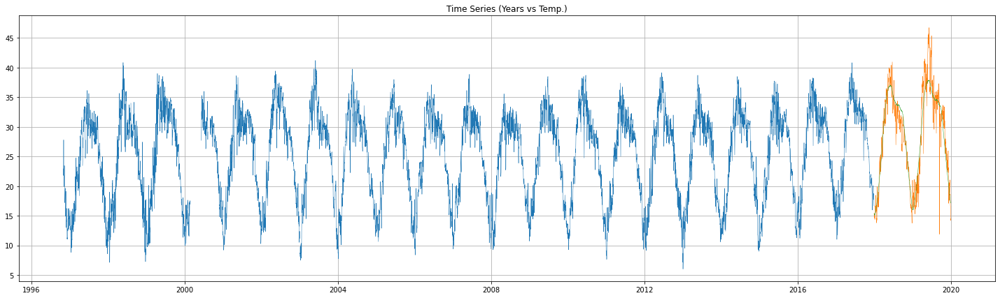

In [ ]:
plt.figure(figsize=(25, 7))
plt.plot(data_tt, linewidth=.5)
plt.plot(y_truett, linewidth=.5)
plt.plot(y_predtt, linewidth=.5)
#plt.plot(data_t, linewidth=.5)
plt.grid()
plt.title("Time Series (Years vs Temp.)")
plt.show()

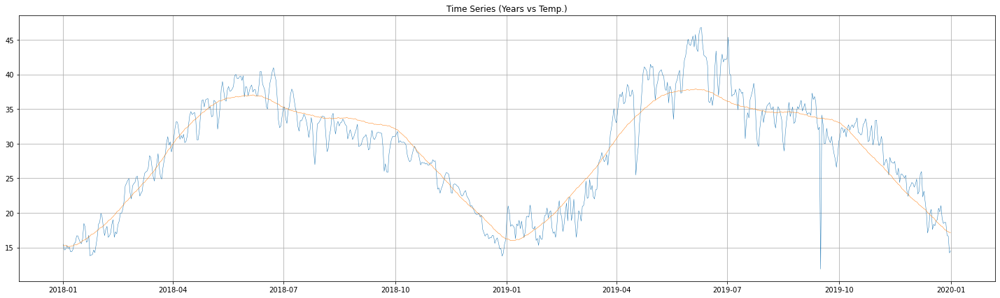

In [ ]:
plt.figure(figsize=(25, 7))
#plt.plot(data_tt, linewidth=.5)
plt.plot(y_truett, linewidth=.5)
plt.plot(y_predtt, linewidth=.5)
#plt.plot(data_t, linewidth=.5)
plt.grid()
plt.title("Time Series (Years vs Temp.)")
plt.show()

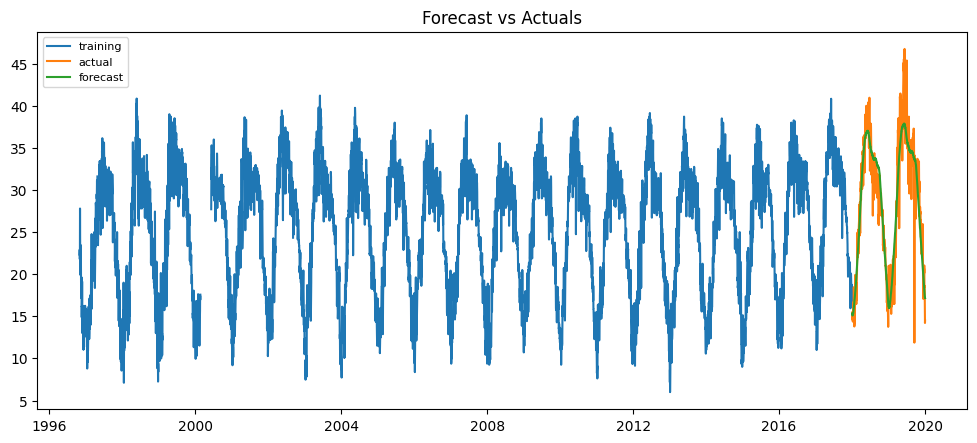

In [ ]:
plt.figure(figsize=(12,5), dpi=100)
plt.plot(data_tt, label='training')
plt.plot(y_truett, label='actual')
plt.plot(y_predtt, label='forecast')
#plt.fill_between(lower_seriesh.index, lower_seriesh, upper_seriesh, color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

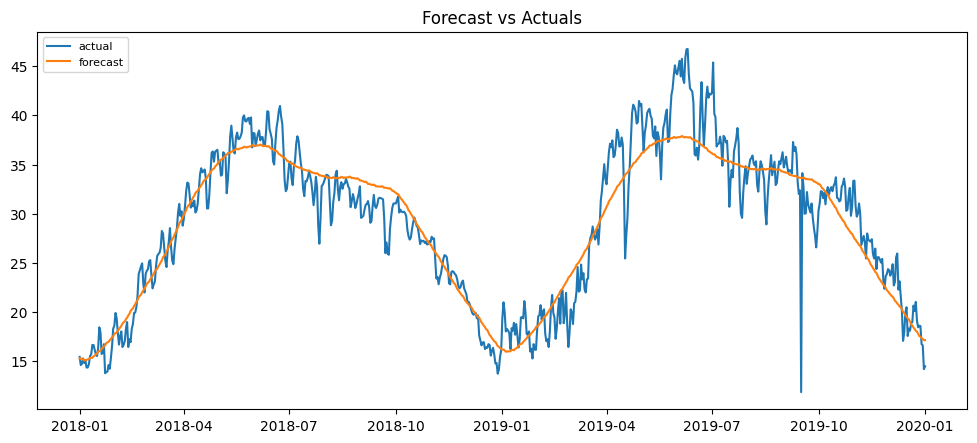

In [ ]:
plt.figure(figsize=(12,5), dpi=100)
#plt.plot(data_tt, label='training')
plt.plot(y_truett, label='actual')
plt.plot(y_predtt, label='forecast')
#plt.fill_between(lower_seriesh.index, lower_seriesh, upper_seriesh, color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

In [ ]:
y_truehh = pd.DataFrame(y_trueh)
y_predhh = pd.DataFrame(y_pred_bslh)

In [ ]:
y_predhh = y_predhh.rename(index=str, columns={ 'yhat': 'humidity'})

y_predhh.index = pd.date_range(start='1-1-2018', periods=731)

y_predhh = pd.DataFrame( y_predhh['humidity'], columns=[ "humidity"], index= pd.date_range(start='1-1-2018', periods=731))

y_predhh.index.name = 'datetime_utc'

In [ ]:
y_truehh = y_truehh.rename(index=str, columns={ 'yhat': 'humidity'})

y_truehh.index = pd.date_range(start='1-1-2018', periods=731)

y_truehh = pd.DataFrame( y_truehh['humidity'], columns=[ "humidity"], index= pd.date_range(start='1-1-2018', periods=731))

y_truehh.index.name = 'datetime_utc'

In [ ]:
y_predhh

,humidity
datetime_utc,
2018-01-01,62.122567
2018-01-02,62.448202
2018-01-03,62.102446
2018-01-04,62.282656
2018-01-05,62.628517
...,...
2019-12-28,50.626795
2019-12-29,51.112164
2019-12-30,51.225760


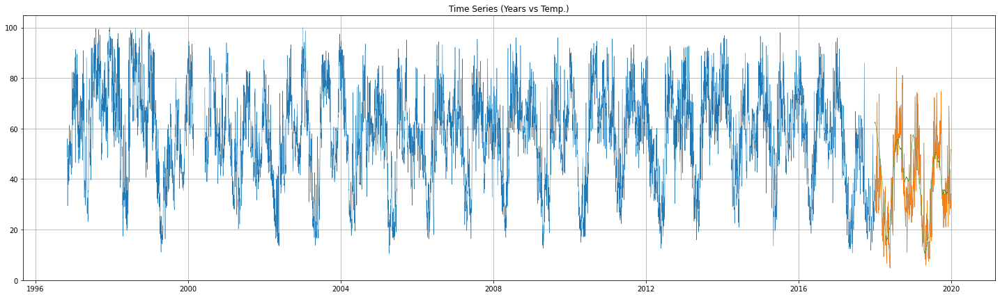

In [ ]:
plt.figure(figsize=(25, 7))
plt.plot(data_hh, linewidth=.5)
plt.plot(y_truehh, linewidth=.5)
plt.plot(y_predhh, linewidth=.5)
#plt.plot(data_t, linewidth=.5)
plt.grid()
plt.title("Time Series (Years vs Temp.)")
plt.show()

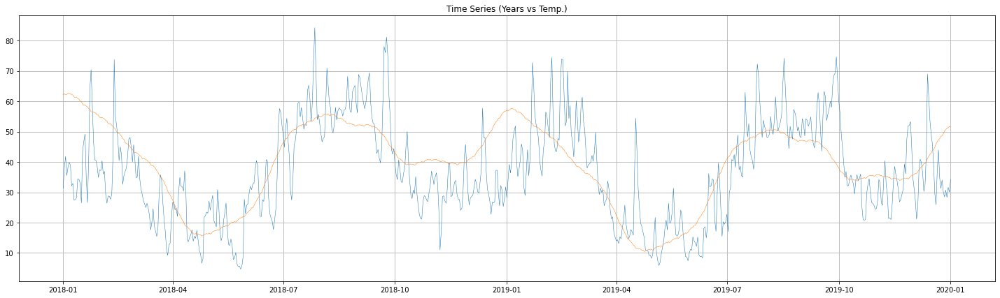

In [ ]:
plt.figure(figsize=(25, 7))
#plt.plot(data_hh, linewidth=.5)
plt.plot(y_truehh, linewidth=.5)
plt.plot(y_predhh, linewidth=.5)
#plt.plot(data_t, linewidth=.5)
plt.grid()
plt.title("Time Series (Years vs Temp.)")
plt.show()

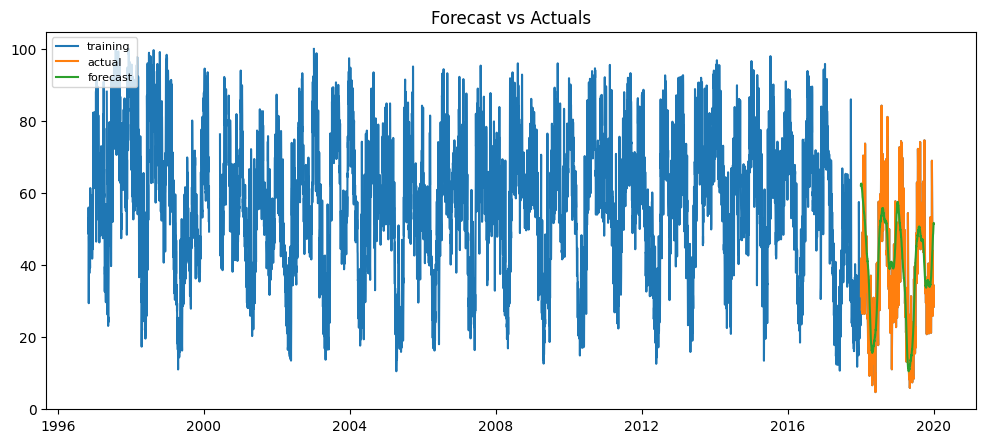

In [ ]:
plt.figure(figsize=(12,5), dpi=100)
plt.plot(data_hh, label='training')
plt.plot(y_truehh, label='actual')
plt.plot(y_predhh, label='forecast')
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

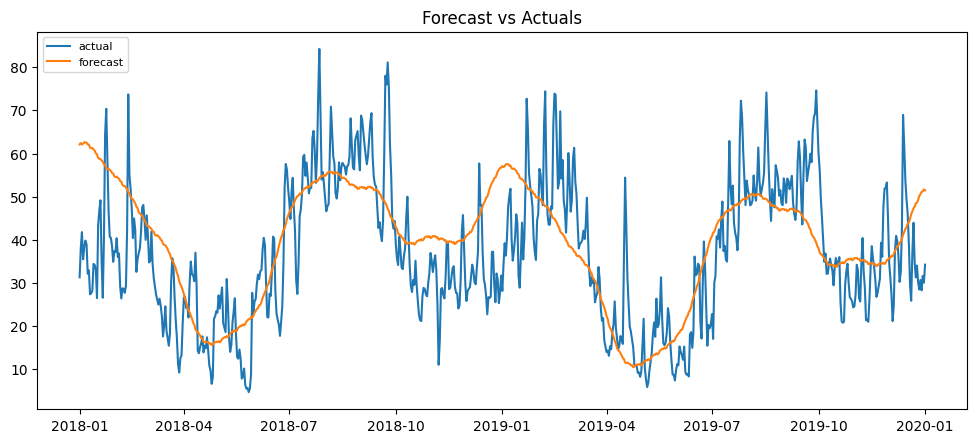

In [ ]:
plt.figure(figsize=(12,5), dpi=100)
#plt.plot(data_hh, label='training')
plt.plot(y_truehh, label='actual')
plt.plot(y_predhh, label='forecast')
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

In [ ]:
y_predtt['temprature']

datetime_utc
2018-01-01    15.325264
2018-01-02    15.243943
2018-01-03    15.287770
2018-01-04    15.202803
2018-01-05    15.097392
                ...    
2019-12-28    17.499415
2019-12-29    17.354138
2019-12-30    17.268539
2019-12-31    17.150659
2020-01-01    17.156827
Freq: D, Name: temprature, Length: 731, dtype: float64

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt

print('for temperature mae:', mean_absolute_error(y_predtt['temprature'], y_truett['temprature']), ', mse: ', mean_squared_error(y_predtt['temprature'], y_truett['temprature']), ', rmse:', sqrt( mean_squared_error(y_predtt['temprature'], y_truett['temprature'])))

print('for humidity mae:', mean_absolute_error(y_predhh['humidity'], y_truehh['humidity']), ', mse: ', mean_squared_error(y_predhh['humidity'], y_truehh['humidity']), ', rmse:', sqrt( mean_squared_error(y_predhh['humidity'], y_truehh['humidity'])))

for temperature mae: 2.0223610847423723 , mse:  7.447978466348618 , rmse: 2.729098471354344
for humidity mae: 9.752020712973811 , mse:  157.16031234460453 , rmse: 12.536359612926097
